Lambda School Data Science

*Unit 2, Sprint 2, Module 2*

---

# Random Forests

## Assignment
- [ ] Read [“Adopting a Hypothesis-Driven Workflow”](http://archive.is/Nu3EI), a blog post by a Lambda DS student about the Tanzania Waterpumps challenge.
- [ ] Continue to participate in our Kaggle challenge.
- [ ] Define a function to wrangle train, validate, and test sets in the same way. Clean outliers and engineer features.
- [ ] Try Ordinal Encoding.
- [ ] Try a Random Forest Classifier.
- [ ] Submit your predictions to our Kaggle competition. (Go to our Kaggle InClass competition webpage. Use the blue **Submit Predictions** button to upload your CSV file. Or you can use the Kaggle API to submit your predictions.)
- [ ] Commit your notebook to your fork of the GitHub repo.

## Stretch Goals

### Doing
- [ ] Add your own stretch goal(s) !
- [ ] Do more exploratory data analysis, data cleaning, feature engineering, and feature selection.
- [ ] Try other [categorical encodings](https://contrib.scikit-learn.org/category_encoders/).
- [ ] Get and plot your feature importances.
- [ ] Make visualizations and share on Slack.

### Reading

Top recommendations in _**bold italic:**_

#### Decision Trees
- A Visual Introduction to Machine Learning, [Part 1: A Decision Tree](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/),  and _**[Part 2: Bias and Variance](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/)**_
- [Decision Trees: Advantages & Disadvantages](https://christophm.github.io/interpretable-ml-book/tree.html#advantages-2)
- [How a Russian mathematician constructed a decision tree — by hand — to solve a medical problem](http://fastml.com/how-a-russian-mathematician-constructed-a-decision-tree-by-hand-to-solve-a-medical-problem/)
- [How decision trees work](https://brohrer.github.io/how_decision_trees_work.html)
- [Let’s Write a Decision Tree Classifier from Scratch](https://www.youtube.com/watch?v=LDRbO9a6XPU)

#### Random Forests
- [_An Introduction to Statistical Learning_](http://www-bcf.usc.edu/~gareth/ISL/), Chapter 8: Tree-Based Methods
- [Coloring with Random Forests](http://structuringtheunstructured.blogspot.com/2017/11/coloring-with-random-forests.html)
- _**[Random Forests for Complete Beginners: The definitive guide to Random Forests and Decision Trees](https://victorzhou.com/blog/intro-to-random-forests/)**_

#### Categorical encoding for trees
- [Are categorical variables getting lost in your random forests?](https://roamanalytics.com/2016/10/28/are-categorical-variables-getting-lost-in-your-random-forests/)
- [Beyond One-Hot: An Exploration of Categorical Variables](http://www.willmcginnis.com/2015/11/29/beyond-one-hot-an-exploration-of-categorical-variables/)
- _**[Categorical Features and Encoding in Decision Trees](https://medium.com/data-design/visiting-categorical-features-and-encoding-in-decision-trees-53400fa65931)**_
- _**[Coursera — How to Win a Data Science Competition: Learn from Top Kagglers — Concept of mean encoding](https://www.coursera.org/lecture/competitive-data-science/concept-of-mean-encoding-b5Gxv)**_
- [Mean (likelihood) encodings: a comprehensive study](https://www.kaggle.com/vprokopev/mean-likelihood-encodings-a-comprehensive-study)
- [The Mechanics of Machine Learning, Chapter 6: Categorically Speaking](https://mlbook.explained.ai/catvars.html)

#### Imposter Syndrome
- [Effort Shock and Reward Shock (How The Karate Kid Ruined The Modern World)](http://www.tempobook.com/2014/07/09/effort-shock-and-reward-shock/)
- [How to manage impostor syndrome in data science](https://towardsdatascience.com/how-to-manage-impostor-syndrome-in-data-science-ad814809f068)
- ["I am not a real data scientist"](https://brohrer.github.io/imposter_syndrome.html)
- _**[Imposter Syndrome in Data Science](https://caitlinhudon.com/2018/01/19/imposter-syndrome-in-data-science/)**_


### More Categorical Encodings

**1.** The article **[Categorical Features and Encoding in Decision Trees](https://medium.com/data-design/visiting-categorical-features-and-encoding-in-decision-trees-53400fa65931)** mentions 4 encodings:

- **"Categorical Encoding":** This means using the raw categorical values as-is, not encoded. Scikit-learn doesn't support this, but some tree algorithm implementations do. For example, [Catboost](https://catboost.ai/), or R's [rpart](https://cran.r-project.org/web/packages/rpart/index.html) package.
- **Numeric Encoding:** Synonymous with Label Encoding, or "Ordinal" Encoding with random order. We can use [category_encoders.OrdinalEncoder](https://contrib.scikit-learn.org/category_encoders/ordinal.html).
- **One-Hot Encoding:** We can use [category_encoders.OneHotEncoder](https://contrib.scikit-learn.org/category_encoders/onehot.html).
- **Binary Encoding:** We can use [category_encoders.BinaryEncoder](https://contrib.scikit-learn.org/category_encoders/binary.html).


**2.** The short video 
**[Coursera — How to Win a Data Science Competition: Learn from Top Kagglers — Concept of mean encoding](https://www.coursera.org/lecture/competitive-data-science/concept-of-mean-encoding-b5Gxv)** introduces an interesting idea: use both X _and_ y to encode categoricals.

Category Encoders has multiple implementations of this general concept:

- [CatBoost Encoder](https://contrib.scikit-learn.org/category_encoders/catboost.html)
- [Generalized Linear Mixed Model Encoder](https://contrib.scikit-learn.org/category_encoders/glmm.html)
- [James-Stein Encoder](https://contrib.scikit-learn.org/category_encoders/jamesstein.html)
- [Leave One Out](https://contrib.scikit-learn.org/category_encoders/leaveoneout.html)
- [M-estimate](https://contrib.scikit-learn.org/category_encoders/mestimate.html)
- [Target Encoder](https://contrib.scikit-learn.org/category_encoders/targetencoder.html)
- [Weight of Evidence](https://contrib.scikit-learn.org/category_encoders/woe.html)

Category Encoder's mean encoding implementations work for regression problems or binary classification problems. 

For multi-class classification problems, you will need to temporarily reformulate it as binary classification. For example:

```python
encoder = ce.TargetEncoder(min_samples_leaf=..., smoothing=...) # Both parameters > 1 to avoid overfitting
X_train_encoded = encoder.fit_transform(X_train, y_train=='functional')
X_val_encoded = encoder.transform(X_train, y_val=='functional')
```

For this reason, mean encoding won't work well within pipelines for multi-class classification problems.

**3.** The **[dirty_cat](https://dirty-cat.github.io/stable/)** library has a Target Encoder implementation that works with multi-class classification.

```python
 dirty_cat.TargetEncoder(clf_type='multiclass-clf')
```
It also implements an interesting idea called ["Similarity Encoder" for dirty categories](https://www.slideshare.net/GaelVaroquaux/machine-learning-on-non-curated-data-154905090).

However, it seems like dirty_cat doesn't handle missing values or unknown categories as well as category_encoders does. And you may need to use it with one column at a time, instead of with your whole dataframe.

**4. [Embeddings](https://www.kaggle.com/colinmorris/embedding-layers)** can work well with sparse / high cardinality categoricals.

_**I hope it’s not too frustrating or confusing that there’s not one “canonical” way to encode categoricals. It’s an active area of research and experimentation — maybe you can make your own contributions!**_

### Setup

You can work locally (follow the [local setup instructions](https://lambdaschool.github.io/ds/unit2/local/)) or on Colab (run the code cell below).

In [134]:
%%capture
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
    !pip install category_encoders==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [135]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
import pandas_profiling

train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

train.shape, test.shape

((59400, 41), (14358, 40))

In [137]:
train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              stratify=train['status_group'], random_state=42)

def wrangle(X):
    
    # Prevent SettingWithCopyWarning
    X = X.copy()
    
    # Set ID as index
    X = X.set_index('id')
    
    #Replace close to zeros with zeros
    X['latitude'] = X['latitude'].replace(-2e-08, 0)
    
    #Replace 0s with NaNs
    cols_with_zeros = ['longitude', 'latitude', 'construction_year', 
                       'gps_height', 'population']
    for col in cols_with_zeros:
        X[col] = X[col].replace(0, np.nan)
        X[col+'_MISSING'] = X[col].isnull()
    

    # Drop duplicate columns
    duplicates = ['quantity_group', 'payment_type']
    X = X.drop(columns=duplicates)
    
    # Drop recorded_by (never varies)
    unusable_variance = ['recorded_by']
    X = X.drop(columns=unusable_variance)
    
    # Convert date_recorded to datetime
    X['date_recorded'] = pd.to_datetime(X['date_recorded'], infer_datetime_format=True)
    
    # Extract components from date_recorded, then drop the original column
    X['year_recorded'] = X['date_recorded'].dt.year
    X['month_recorded'] = X['date_recorded'].dt.month
    X['day_recorded'] = X['date_recorded'].dt.day
    X = X.drop(columns='date_recorded')
    
    # Engineer feature: how many years from construction_year to date_recorded
    X['years'] = X['year_recorded'] - X['construction_year']
    X['years_MISSING'] = X['years'].isnull()
    
    # Engineer feature:
    # Getting the range of longitude and latitudes in dataset
    long_min = X.describe().loc['min', 'longitude']
    long_max = X.describe().loc['max', 'longitude']
    lat_min = X.describe().loc['min', 'latitude']
    lat_max = X.describe().loc['max', 'latitude']
    lat_range = lat_max - lat_min
    long_range = long_max - long_min

    # Creating N regions
    n = 100
    lat_step = lat_range/np.sqrt(n) 
    lon_step = long_range/np.sqrt(n) 
    to_lat_bin = lambda x: np.floor(x / lat_step) * lat_step
    to_lon_bin = lambda x: np.floor(x / lon_step) * lon_step
    
    # Add a bunch of regions as strings
    X["latbin"] = X.latitude.map(to_lat_bin)
    X["lonbin"] = X.longitude.map(to_lon_bin)
    X["latbin"] = X["latbin"].astype(str)
    X["lonbin"] = X["latbin"].astype(str)
    
    #Drop latitude and longitude (high multicolinearity)
    #df = df.drop(['latitude', 'longitude'], axis=1)

    # Drop columns with any of NaNs
    #df = df.drop(columns=[i for i in list(df.isna().sum().sort_values()[-7:].index) if df.isna().sum().sort_values()[i] > 500], axis=1)
    
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

In [16]:
train.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,...,construction_year_MISSING,gps_height_MISSING,population_MISSING,year_recorded,month_recorded,day_recorded,years,years_MISSING,latbin,lonbin
43360,0.0,NaN,NaN,NaN,33.542898,-9.174777,Kwa Mzee Noa,0,Lake Nyasa,Mpandapanda,...,True,True,True,2011,7,27,NaN,True,-9.585878246999998,-9.585878246999998
7263,500.0,Rc Church,2049.0,ACRA,34.665760,-9.308548,Kwa Yasinta Ng'Ande,0,Rufiji,Kitichi,...,False,False,False,2011,3,23,3.0,False,-9.585878246999998,-9.585878246999998
2486,25.0,Donor,290.0,Do,38.238568,-6.179919,Kwasungwini,0,Wami / Ruvu,Kwedigongo,...,False,False,False,2011,3,7,1.0,False,-6.390585497999998,-6.390585497999998
313,0.0,Government Of Tanzania,NaN,DWE,30.716727,-1.289055,Kwajovin 2,0,Lake Victoria,Kihanga,...,True,True,True,2011,7,31,NaN,True,-2.1301951659999996,-2.1301951659999996
52726,0.0,Water,NaN,Gove,35.389331,-6.399942,Chama,0,Internal,Mtakuj,...,True,True,True,2011,3,10,NaN,True,-7.455683080999998,-7.455683080999998


In [17]:
train.profile_report()

Summarize dataset:   0%|          | 0/62 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
# The status_group column is the target
target = 'status_group'

# Get a dataframe with all train columns except the target
train_features = train.drop(columns=[target])

# Get a list of the numeric features
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

# Get a series with the cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

# Get a list of all categorical features with cardinality <= 50
low_card_features = cardinality[cardinality <= 50].index.tolist()

# Get a list of all categorical features with cardinality > 50
high_card_features = cardinality[cardinality > 50].index.tolist()

# Combine the lists 
features = numeric_features + categorical_features

In [26]:
train_features.columns

Index(['amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'num_private', 'basin', 'subvillage', 'region',
       'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'scheme_management', 'scheme_name', 'permit',
       'construction_year', 'extraction_type', 'extraction_type_group',
       'extraction_type_class', 'management', 'management_group', 'payment',
       'water_quality', 'quality_group', 'quantity', 'source', 'source_type',
       'source_class', 'waterpoint_type', 'waterpoint_type_group',
       'longitude_MISSING', 'latitude_MISSING', 'construction_year_MISSING',
       'gps_height_MISSING', 'population_MISSING', 'year_recorded',
       'month_recorded', 'day_recorded', 'years', 'years_MISSING', 'latbin',
       'lonbin'],
      dtype='object')

In [28]:
# YOUR CODE HERE
X_train = train[train_features.columns]
X_val = val[train_features.columns]
y_train = train[target]
y_val = val[target]
X_test = test[train_features.columns]
X_train.shape, y_train.shape, X_val.shape, y_val.shape. X_test.shape

((47520, 47), (47520,), (11880, 47), (11880,), (14358, 47))

In [31]:
# Imports
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from category_encoders import OrdinalEncoder, BinaryEncoder
from sklearn.compose import ColumnTransformer
from category_encoders import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, f_classif, chi2, SelectPercentile

In [76]:
# First attempt!
# Doing binary encoding for high cardinality variables and ordinal encoding for others

# Set up our preprocessor/column transformer
b_transformer = Pipeline(steps=[('binary', BinaryEncoder())])
o_transformer = Pipeline(steps=[('ordinal', OrdinalEncoder())])

preprocessor = ColumnTransformer(
    transformers=[
        ('binary', b_transformer, high_card_features),
        ('ordinal', o_transformer, low_card_features)
    ])

# Set up the pipeline
pipeline = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('simpleimputer', SimpleImputer()),
    ('randomforestclassifier', RandomForestClassifier(n_jobs = -1))]
)

pipeline.fit(X_train, y_train)


/opt/anaconda3/envs/unit_2/lib/python3.8/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('binary',
                                                  Pipeline(steps=[('binary',
                                                                   BinaryEncoder())]),
                                                  ['funder', 'installer',
                                                   'wpt_name', 'subvillage',
                                                   'lga', 'ward',
                                                   'scheme_name']),
                                                 ('ordinal',
                                                  Pipeline(steps=[('ordinal',
                                                                   OrdinalEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'scheme_management',
                    

In [77]:
print('Val accuracy = ', pipeline.score(X_val, y_val))

Val accuracy =  0.7885521885521886


In [78]:
# Second attempt!
# Doing binary encoding for all variables

# Set up our preprocessor/column transformer
b_transformer = Pipeline(steps=[('binary', BinaryEncoder())])

preprocessor = ColumnTransformer(
    transformers=[
        ('binary', b_transformer, train_features.columns)
    ])

# Set up the pipeline
pipeline = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('simpleimputer', SimpleImputer()),
    ('randomforestclassifier', RandomForestClassifier(n_jobs = -1))]
)

pipeline.fit(X_train, y_train)



/opt/anaconda3/envs/unit_2/lib/python3.8/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('binary',
                                                  Pipeline(steps=[('binary',
                                                                   BinaryEncoder())]),
                                                  Index(['amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'num_private', 'basin', 'subvillage', 'region',
       'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'scheme_management', 'schem...
       'source_class', 'waterpoint_type', 'waterpoint_type_group',
       'longitude_MISSING', 'latitude_MISSING', 'construction_year_MISSING',
       'gps_height_MISSING', 'population_MISSING', 'year_recorded',
       'month_recorded', 'day_recorded', 'years', 'years_MISSING', 'latbin',
       'lonbin'],
      dtype='object'))])),
                ('simpleimputer', SimpleImputer()),
                ('randomforestcla

In [79]:
print('Val accuracy = ', pipeline.score(X_val, y_val))

Val accuracy =  0.8047979797979798


In [109]:
# Third attempt!
# Doing ordinal encoding for all variables

# Set up our preprocessor/column transformer
o_transformer = Pipeline(steps=[('ordinal', OrdinalEncoder())])

preprocessor = ColumnTransformer(
    transformers=[
        ('ordinal', o_transformer, train_features.columns)
    ])

# Set up the pipeline
pipeline = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('simpleimputer', SimpleImputer()),
    ('randomforestclassifier', RandomForestClassifier(criterion = 'entropy',
                                                      n_estimators = 188,
                                                      n_jobs = -1))]
)

pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  Pipeline(steps=[('ordinal',
                                                                   OrdinalEncoder())]),
                                                  Index(['amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'num_private', 'basin', 'subvillage', 'region',
       'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'scheme_management', 'sc...
       'longitude_MISSING', 'latitude_MISSING', 'construction_year_MISSING',
       'gps_height_MISSING', 'population_MISSING', 'year_recorded',
       'month_recorded', 'day_recorded', 'years', 'years_MISSING', 'latbin',
       'lonbin'],
      dtype='object'))])),
                ('simpleimputer', SimpleImputer()),
                ('randomforestclassifier',
                 RandomForestClassifier(criterion='entrop

In [110]:
print('Val accuracy = ', pipeline.score(X_val, y_val))

Val accuracy =  0.8121212121212121


In [99]:
# Fine tuning random forest hyperparameters
# Finetuning random forest hyperparameters

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 10)]

## Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]


# Create the random grid

random_grid = {#'n_estimators': n_estimators#,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf
}
print(random_grid)                     




{'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [100]:
model = Pipeline(steps=[('preprocessor', preprocessor),
                      ('simpleimputer', SimpleImputer()),
                      ('classifier', GridSearchCV(RandomForestClassifier(criterion = 'entropy',
                                                      n_estimators = 188,
                                                      n_jobs = -1), random_grid))])

model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordinal',
                                                  Pipeline(steps=[('ordinal',
                                                                   OrdinalEncoder())]),
                                                  Index(['amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'num_private', 'basin', 'subvillage', 'region',
       'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'scheme_management', 'sc...
       'month_recorded', 'day_recorded', 'years', 'years_MISSING', 'latbin',
       'lonbin'],
      dtype='object'))])),
                ('simpleimputer', SimpleImputer()),
                ('classifier',
                 GridSearchCV(estimator=RandomForestClassifier(criterion='entropy',
                                                               n_estimators=188,
                                                 

In [101]:
print('Val accuracy = ', model.score(X_val, y_val))

Val accuracy =  0.8087542087542088


In [102]:
#Best parameters according to GridSearchCV
model.named_steps['classifier'].best_params_

{'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 2}

In [140]:
# Check out the column names post-preprocessor
preprocessor = pipeline.named_steps['preprocessor'].named_transformers_['ordinal']
pre_processor_cols = preprocessor.transform(X_val).columns
all_cols = X_train.columns.append(pre_processor_cols)
len(pre_processor_cols)

47

In [141]:
len(rf.feature_importances_)

47

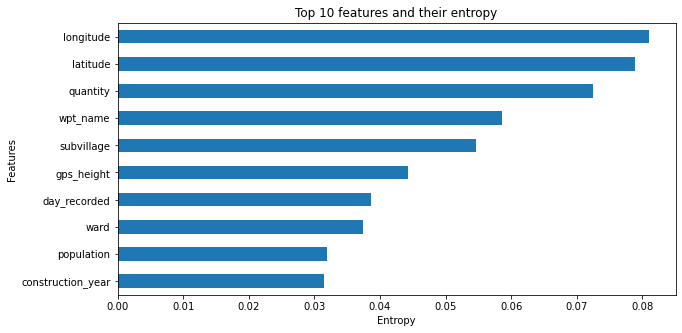

In [162]:
# Get the feature inportances
rf = pipeline.named_steps['randomforestclassifier']
n=10
plt.figure(figsize = (10, n/2))
plt.title(f'Top {n} features and their entropy')
plt.xlabel('Entropy')
plt.ylabel('Features')
importances = pd.Series(rf.feature_importances_, pre_processor_cols)
importances.sort_values()[-n:].plot.barh();

In [112]:
X_test.shape, X_train.shape

((14358, 47), (47520, 47))

In [118]:
X_train

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,...,construction_year_MISSING,gps_height_MISSING,population_MISSING,year_recorded,month_recorded,day_recorded,years,years_MISSING,latbin,lonbin
43360,0.0,NaN,NaN,NaN,33.542898,-9.174777,Kwa Mzee Noa,0,Lake Nyasa,Mpandapanda,...,True,True,True,2011,7,27,NaN,True,-9.585878246999998,-9.585878246999998
7263,500.0,Rc Church,2049.0,ACRA,34.665760,-9.308548,Kwa Yasinta Ng'Ande,0,Rufiji,Kitichi,...,False,False,False,2011,3,23,3.0,False,-9.585878246999998,-9.585878246999998
2486,25.0,Donor,290.0,Do,38.238568,-6.179919,Kwasungwini,0,Wami / Ruvu,Kwedigongo,...,False,False,False,2011,3,7,1.0,False,-6.390585497999998,-6.390585497999998
313,0.0,Government Of Tanzania,NaN,DWE,30.716727,-1.289055,Kwajovin 2,0,Lake Victoria,Kihanga,...,True,True,True,2011,7,31,NaN,True,-2.1301951659999996,-2.1301951659999996
52726,0.0,Water,NaN,Gove,35.389331,-6.399942,Chama,0,Internal,Mtakuj,...,True,True,True,2011,3,10,NaN,True,-7.455683080999998,-7.455683080999998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,50.0,Wd And Id,489.0,WD and ID,38.268574,-5.450254,Kwa Maseko,4,Pangani,Komfungo A,...,False,False,False,2011,3,28,2.0,False,-6.390585497999998,-6.390585497999998
58170,0.0,Danida,NaN,Central government,33.926294,-9.641293,Kwa Asajile Mwangomale,0,Lake Nyasa,Mpanda,...,True,True,True,2011,12,7,NaN,True,-10.650975829999998,-10.650975829999998
17191,0.0,World Bank,599.0,Nandra Construction,39.262924,-10.768079,Shuleni,0,Ruvuma / Southern Coast,Kilimahewa,...,False,False,False,2013,2,2,1.0,False,-11.716073412999998,-11.716073412999998
8192,30.0,Finida German Tanzania Govt,426.0,Finwater,39.348550,-10.642069,Tangini,0,Ruvuma / Southern Coast,Tangini,...,False,False,False,2013,2,7,25.0,False,-10.650975829999998,-10.650975829999998


In [138]:
#Getting Kaggle submissions
X_test = test
y_pred = pd.DataFrame(pipeline.predict(X_test))

submission = y_pred
submission.set_index(X_test.index, inplace=True)
submission.rename(columns={0:'status_group'}, inplace=True)
submission.head()

,status_group
id,
50785,non functional
51630,functional
17168,functional
45559,non functional
49871,functional


In [139]:
submission.to_csv('kaggle_submission_001.csv')